In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd
import matplotlib.pyplot as plt # data processing, CSV file I/O (e.g. pd.read_csv)
import seaborn as sns


# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/hms-harmful-brain-activity-classification/sample_submission.csv
/kaggle/input/hms-harmful-brain-activity-classification/train.csv
/kaggle/input/hms-harmful-brain-activity-classification/test.csv
/kaggle/input/hms-harmful-brain-activity-classification/train_eegs/2208063991.parquet
/kaggle/input/hms-harmful-brain-activity-classification/train_eegs/1712674008.parquet
/kaggle/input/hms-harmful-brain-activity-classification/train_eegs/3959808174.parquet
/kaggle/input/hms-harmful-brain-activity-classification/train_eegs/2958965493.parquet
/kaggle/input/hms-harmful-brain-activity-classification/train_eegs/3973731145.parquet
/kaggle/input/hms-harmful-brain-activity-classification/train_eegs/3725914929.parquet
/kaggle/input/hms-harmful-brain-activity-classification/train_eegs/2917825580.parquet
/kaggle/input/hms-harmful-brain-activity-classification/train_eegs/3497339021.parquet
/kaggle/input/hms-harmful-brain-activity-classification/train_eegs/1378333210.parquet
/kaggle/input/hms

In [2]:
import pandas as pd

train_df = pd.read_csv("/kaggle/input/hms-harmful-brain-activity-classification/train.csv")
print(train_df.head())
print(train_df.info())
print(train_df.describe())


       eeg_id  eeg_sub_id  eeg_label_offset_seconds  spectrogram_id  \
0  1628180742           0                       0.0          353733   
1  1628180742           1                       6.0          353733   
2  1628180742           2                       8.0          353733   
3  1628180742           3                      18.0          353733   
4  1628180742           4                      24.0          353733   

   spectrogram_sub_id  spectrogram_label_offset_seconds    label_id  \
0                   0                               0.0   127492639   
1                   1                               6.0  3887563113   
2                   2                               8.0  1142670488   
3                   3                              18.0  2718991173   
4                   4                              24.0  3080632009   

   patient_id expert_consensus  seizure_vote  lpd_vote  gpd_vote  lrda_vote  \
0       42516          Seizure             3         0         0   

<Axes: title={'center': 'Class Distribution'}, xlabel='expert_consensus'>

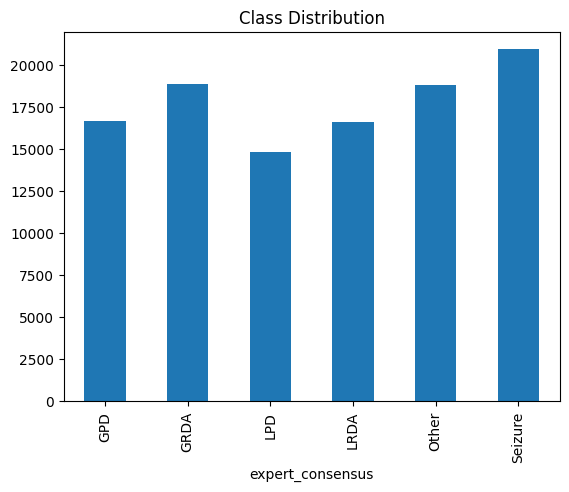

In [3]:
train_df['expert_consensus'].value_counts().sort_index().plot(kind='bar', title="Class Distribution")


In [4]:
import pyarrow.parquet as pq

sample_file = "/kaggle/input/hms-harmful-brain-activity-classification/train_eegs/2208063991.parquet"
eeg_df = pd.read_parquet(sample_file)
print(eeg_df.head())
print(eeg_df.columns)


         Fp1         F3         C3         P3     F7         T3         T5  \
0  18.870001  26.049999  35.619999  52.369999  -3.19  40.410000  39.080002   
1  23.930000  28.980000  37.750000  52.900002   1.86  44.130001  39.340000   
2  15.680000  21.799999  32.169998  45.990002  -7.71  35.090000  30.840000   
3   6.380000  18.340000  28.980000  41.470001 -14.89  24.190001  23.930000   
4  11.170000  26.850000  37.220001  49.709999  -9.57  33.500000  29.770000   

      O1         Fz    Cz         Pz        Fp2         F4     C4     P4  \
0  11.43  24.190001  7.98  59.279999 -33.230000  26.049999   2.39  16.48   
1  10.63  25.250000  5.85  56.889999 -31.629999  26.049999   2.13  13.56   
2   2.39  18.610001  0.80  50.240002 -38.279999  16.480000  -7.98   4.52   
3   0.53  15.950000  0.27  48.910000 -48.119999  11.700000 -12.76   1.86   
4   3.72  24.190001  6.38  54.759998 -41.740002  19.139999  -7.98   6.91   

      F8     T4         T6           O2         EKG  
0   3.46   3.72 -19.

In [5]:
num_patients = train_df['patient_id'].nunique()
print(f"Number of unique patients in train dataset: {num_patients}")

# Number of unique EEG IDs
num_eeg_ids = train_df['eeg_id'].nunique()
print(f"Number of unique EEG IDs in train dataset: {num_eeg_ids}")

Number of unique patients in train dataset: 1950
Number of unique EEG IDs in train dataset: 17089


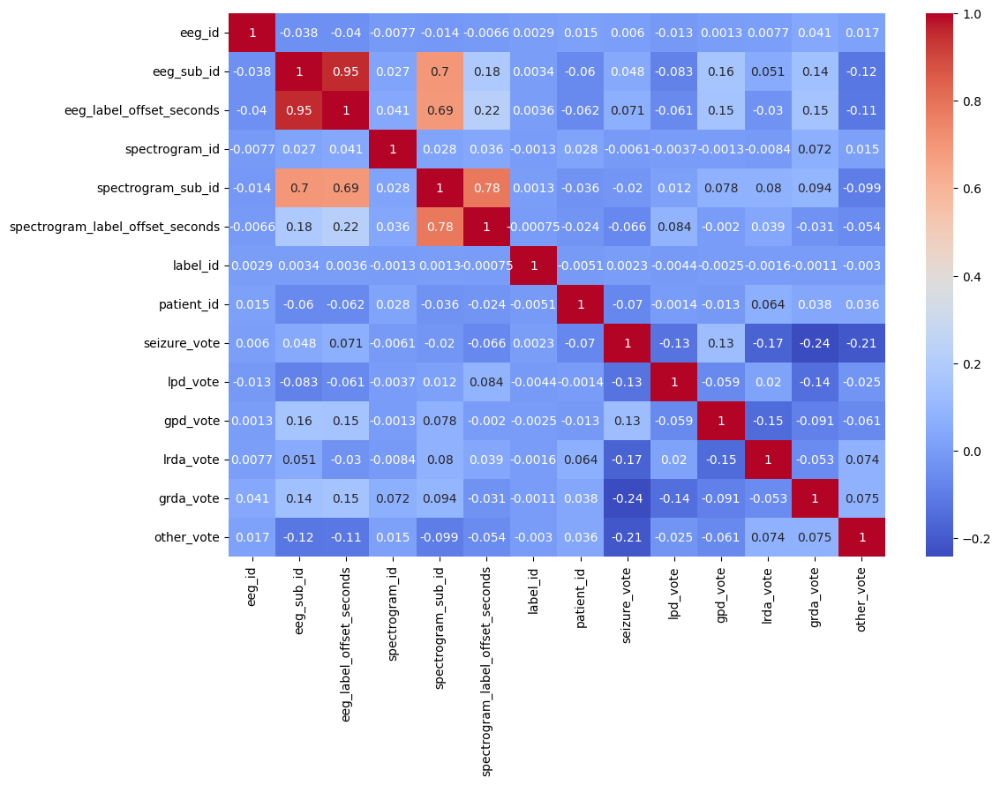

In [6]:
import numpy as np 
import pandas as pd
import matplotlib.pyplot as plt 
import seaborn as sns
numerical_columns = train_df.select_dtypes(include=['int64', 'float64']).columns
corr_matrix = train_df[numerical_columns].corr()

# Increase the size of the figure
plt.figure(figsize=(12, 8)) 

# Heatmap for correlation analysis
# We are using 'coolwarm' colormap here to distinguish positive and negative correlations easily
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm')
plt.show()


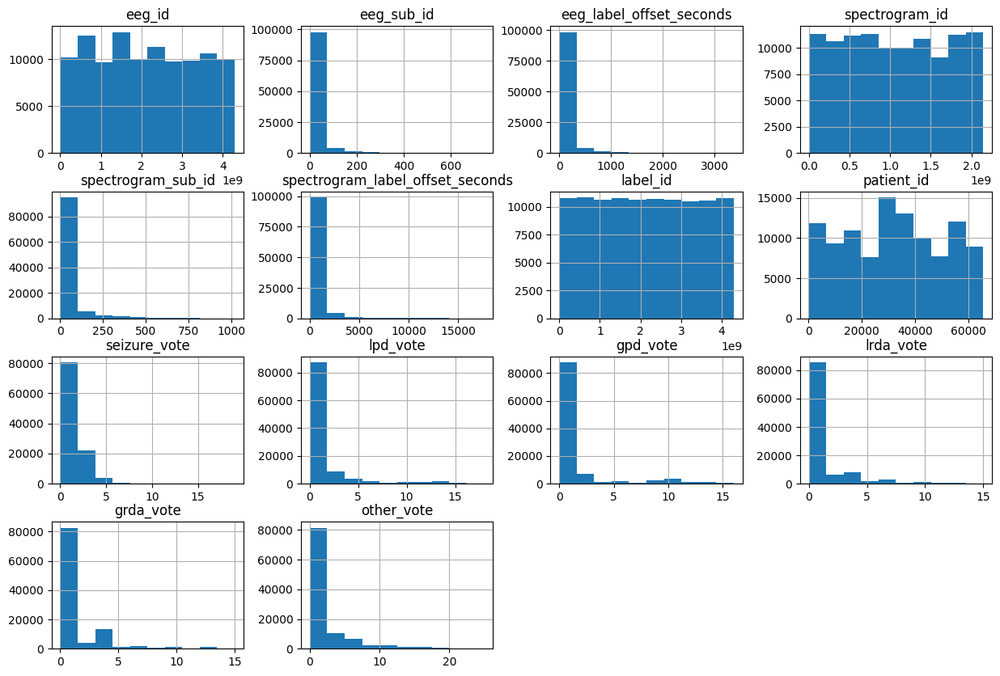

In [7]:
train_df.hist(figsize=(15, 10))
plt.show()

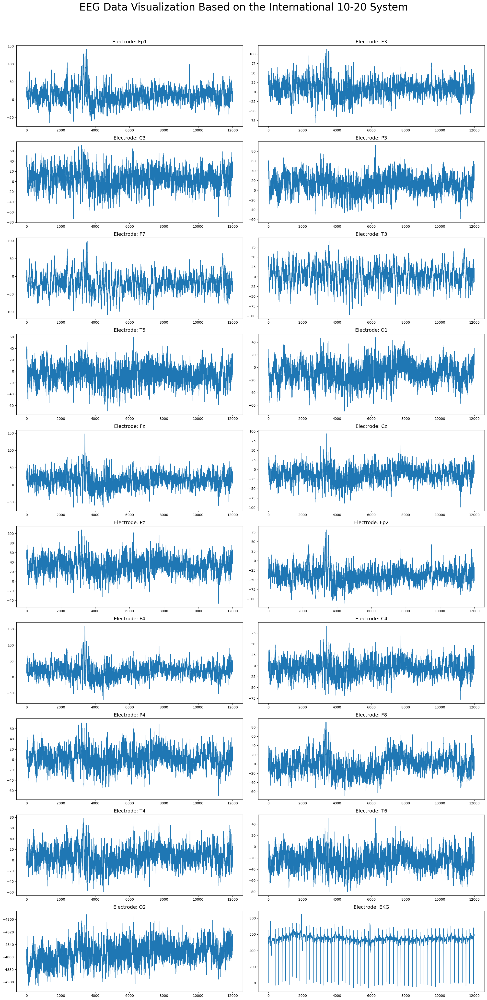

In [8]:
eeg = pd.read_parquet('/kaggle/input/hms-harmful-brain-activity-classification/train_eegs/2208063991.parquet')

#List of columns to plot
columns_to_plot = [
    'Fp1', 'F3', 'C3', 'P3', 'F7', 'T3', 'T5', 'O1', 'Fz', 'Cz', 'Pz', 
    'Fp2', 'F4', 'C4', 'P4', 'F8', 'T4', 'T6', 'O2', 'EKG'
]

# Determine the number of rows/columns needed for subplots
num_plots = len(columns_to_plot)
num_columns = 2  # Set to 2 as per the previous code
num_rows = num_plots // num_columns + (num_plots % num_columns > 0)

# Create subplots
fig, axes = plt.subplots(num_rows, num_columns, figsize=(20, num_rows * 4))

# Flatten the axes array for easy iteration
axes = axes.flatten()

# Plot each column in a subplot
for i, col in enumerate(columns_to_plot):
    axes[i].plot(eeg[col])
    axes[i].set_title(f'Electrode: {col}', fontsize=14)

# Hide any unused subplots
for ax in axes[len(columns_to_plot):]:
    ax.set_visible(False)

# Set the overall figure title
fig.suptitle('EEG Data Visualization Based on the International 10-20 System', fontsize=30, y=1.02)

# Adjust layout to prevent overlap
plt.tight_layout()

# Show the plot
plt.show()

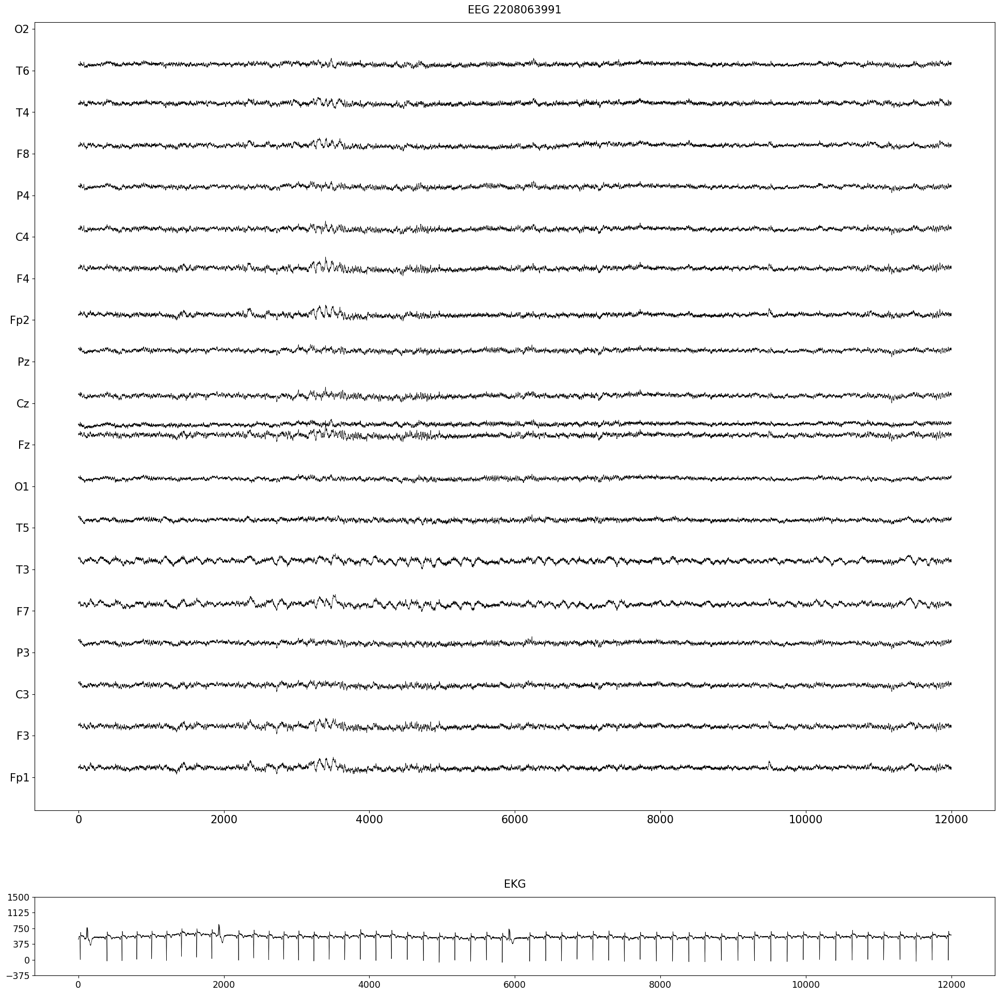

In [9]:
def visualize_eeg_signal(df, title, path=None):
    eeg_columns = [
        'Fp1', 'F3', 'C3', 'P3', 'F7', 'T3',
        'T5', 'O1', 'Fz', 'Cz', 'Pz', 'Fp2',
        'F4', 'C4', 'P4', 'F8', 'T4', 'T6',
        'O2',
    ]
    ekg_column = 'EKG'
    eeg_spacing = 500
    
    fig, axes = plt.subplots(figsize=(24, 24), nrows=2, height_ratios=[10, 1], dpi=100)

    for column_idx, column in enumerate(eeg_columns):
        axes[0].plot(np.arange(0, df.shape[0]), df[column] + (eeg_spacing * column_idx), linewidth=0.5, color='black')
        
    y_ticks = np.arange(0, len(eeg_columns)) * eeg_spacing - 100
    axes[0].set_yticks(y_ticks)
    axes[0].set_yticklabels(eeg_columns)
    axes[0].tick_params(axis='x', labelsize=15)
    axes[0].tick_params(axis='y', labelsize=15)
    axes[0].set_xlabel('')
    axes[0].set_ylabel('')
    axes[0].set_title(title, size=15, pad=12.5, loc='center')
    
    axes[1].plot(np.arange(0, df.shape[0]), df['EKG'], linewidth=0.5, color='black')
    axes[1].set_yticks(np.array(axes[1].get_yticks()) * 1.5)
    axes[1].tick_params(axis='x', labelsize=12.5)
    axes[1].tick_params(axis='y', labelsize=12.5)
    axes[1].set_xlabel('')
    axes[1].set_ylabel('')
    axes[1].set_title('EKG', size=15, pad=12.5, loc='center')
    
    if path is None:
        plt.show()
    else:
        plt.savefig(path, bbox_inches='tight')
        plt.close(fig)


visualize_eeg_signal(
    df=eeg,
    title='EEG 2208063991'
)

        
    
   
    

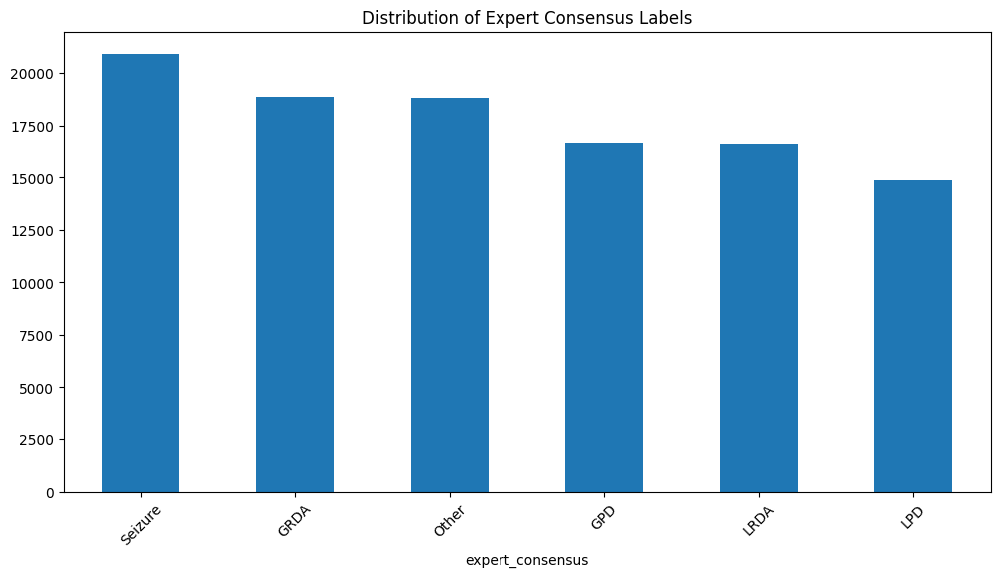

In [10]:
plt.figure(figsize=(12, 6))
train_df['expert_consensus'].value_counts().plot(kind='bar')
plt.title("Distribution of Expert Consensus Labels")
plt.xticks(rotation=45)
plt.show()

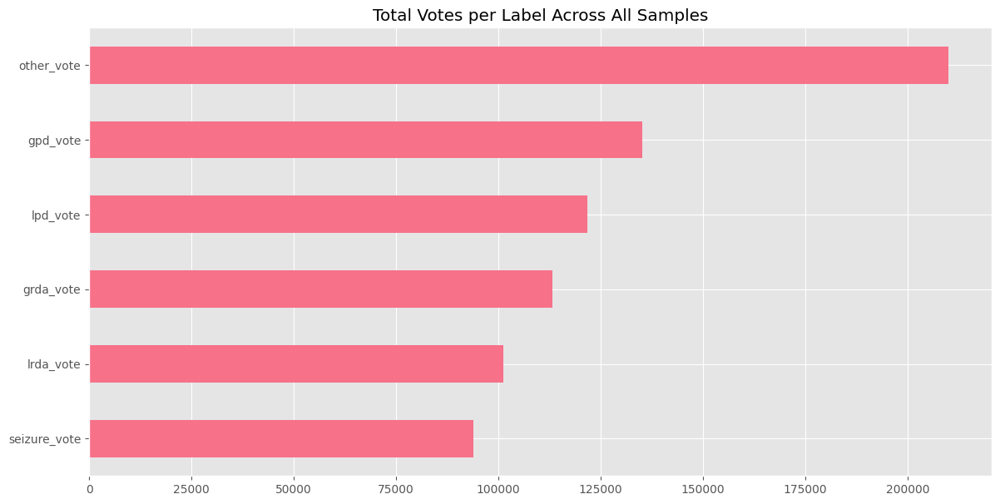

In [11]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pyarrow.parquet as pq
from scipy.signal import welch, spectrogram
import os

# Config
plt.style.use('ggplot')
plt.rcParams['figure.figsize'] = (15, 6)
sns.set_palette("husl")

# Load data
train_df = pd.read_csv("/kaggle/input/hms-harmful-brain-activity-classification/train.csv")
labels = ["seizure_vote", "lpd_vote", "gpd_vote", "lrda_vote", "grda_vote", "other_vote"]
plt.figure(figsize=(14, 7))
train_df[labels].sum().sort_values().plot(kind='barh')
plt.title("Total Votes per Label Across All Samples")
plt.show()

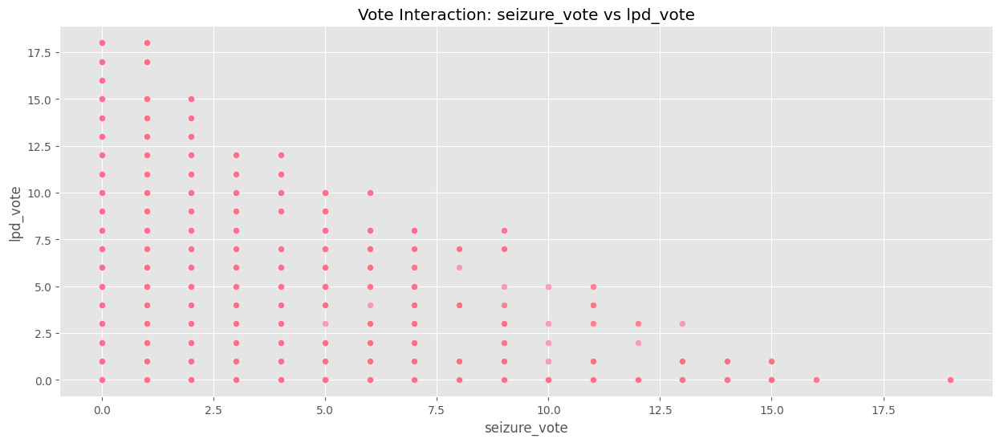

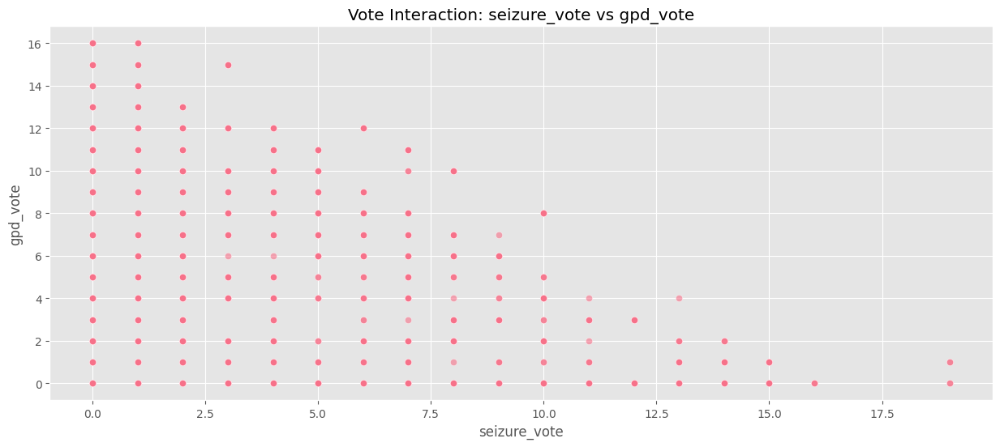

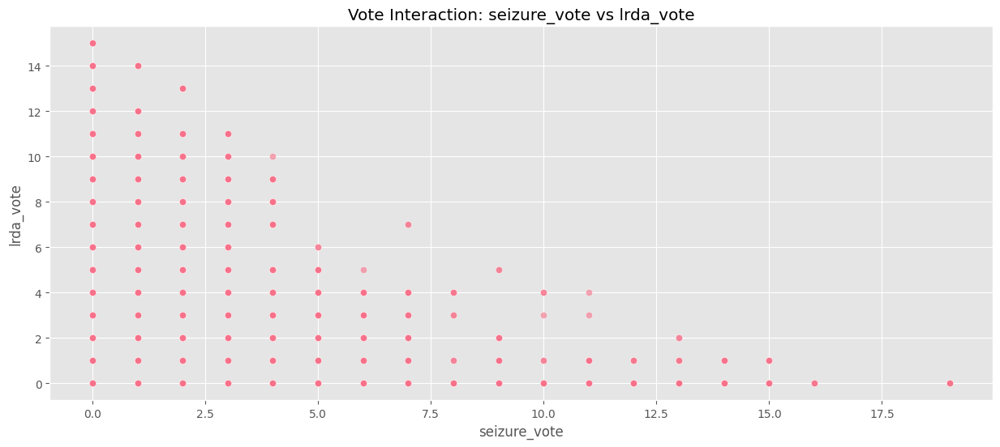

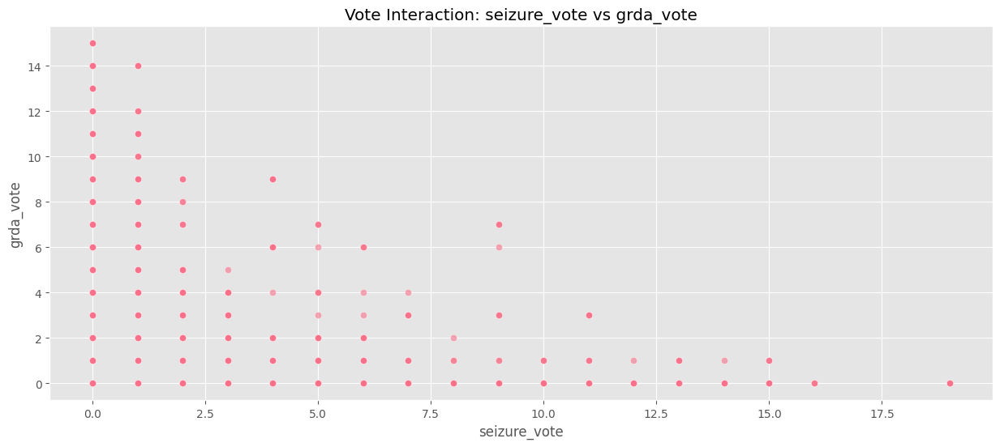

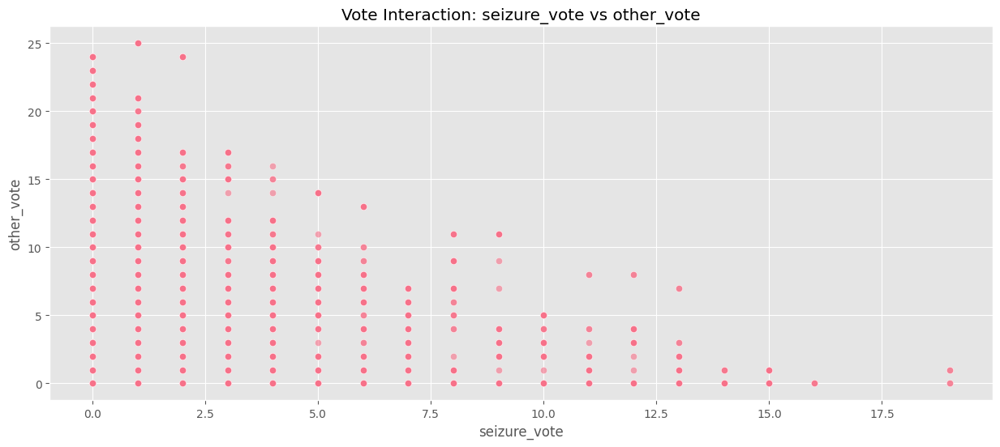

...

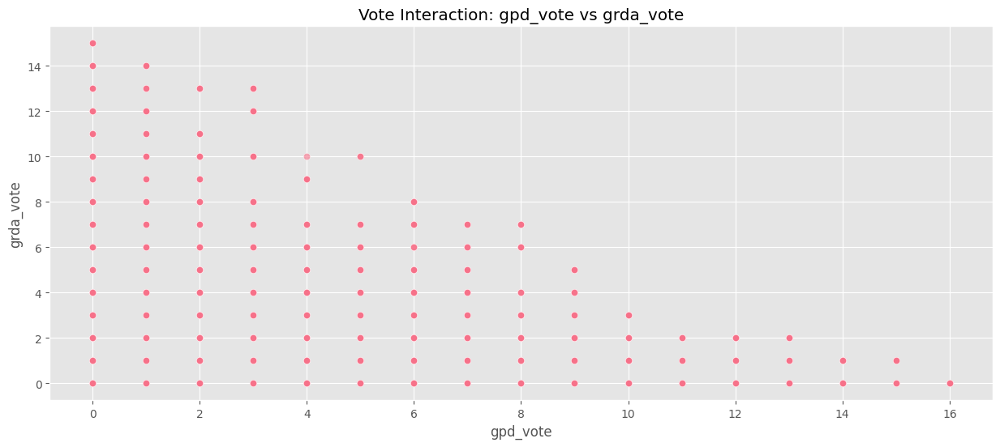

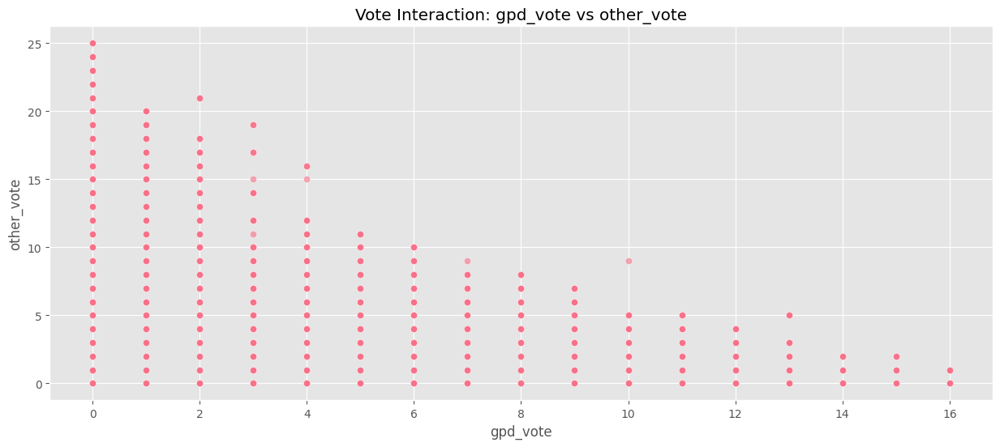

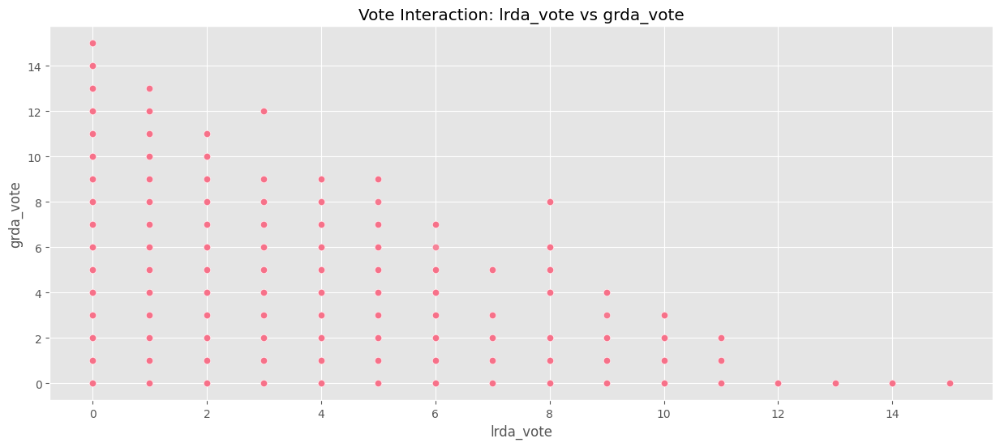

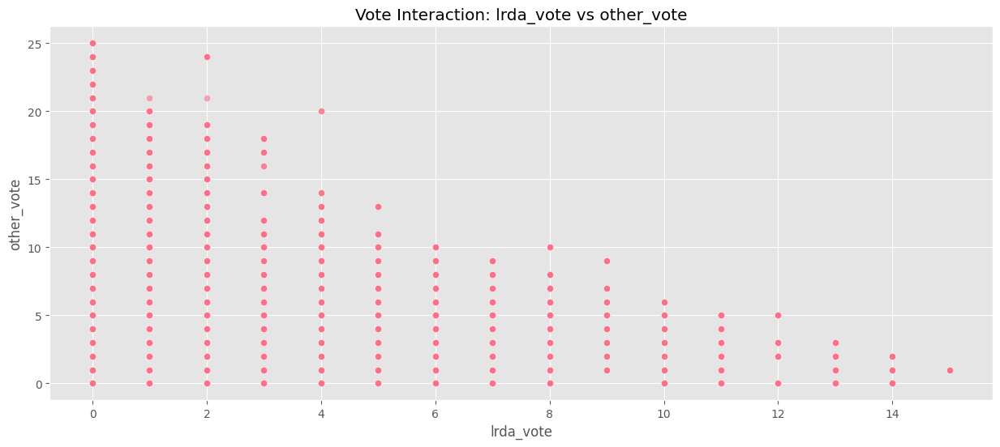

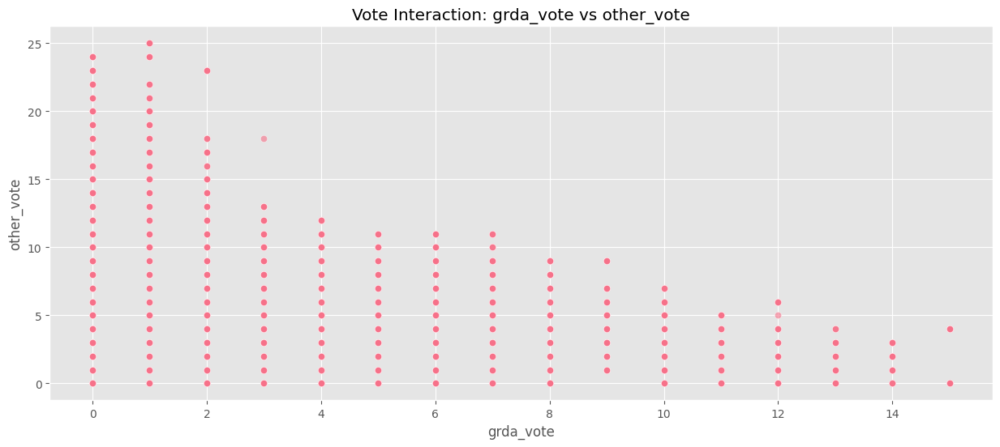

In [12]:
from itertools import combinations
for combo in combinations(labels, 2):
    plt.figure()
    sns.scatterplot(data=train_df, x=combo[0], y=combo[1], alpha=0.6)
    plt.title(f"Vote Interaction: {combo[0]} vs {combo[1]}")
    plt.show()

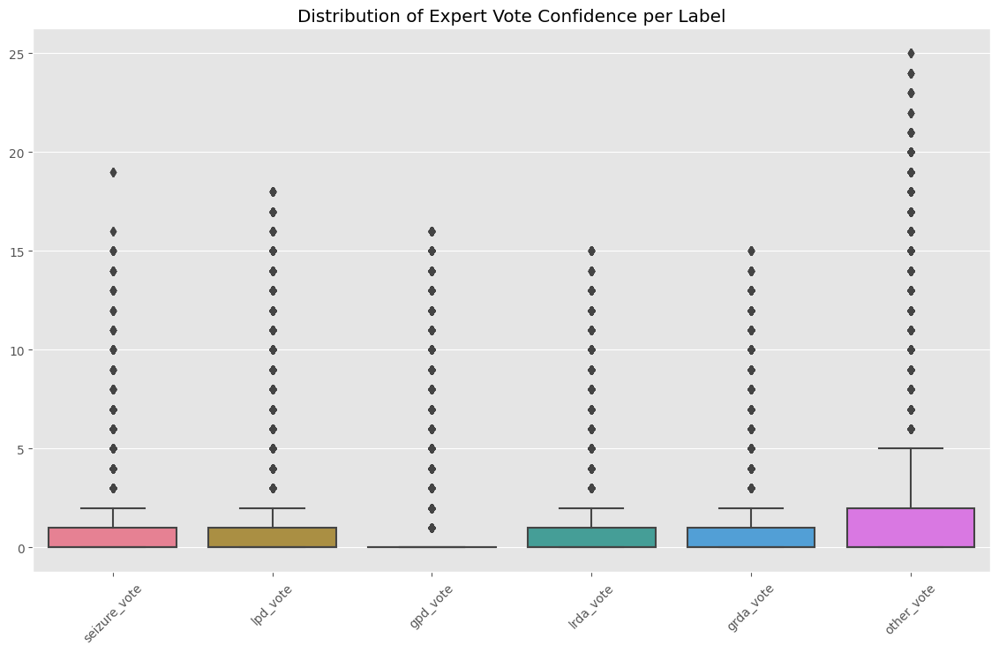

In [13]:
plt.figure(figsize=(14, 8))
sns.boxplot(data=train_df[labels])
plt.title("Distribution of Expert Vote Confidence per Label")
plt.xticks(rotation=45)
plt.show()

/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


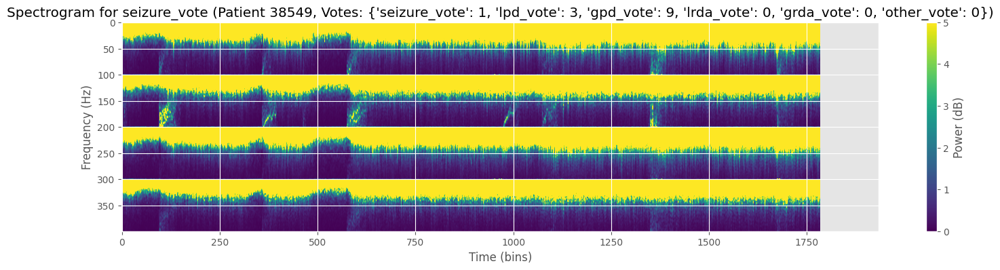

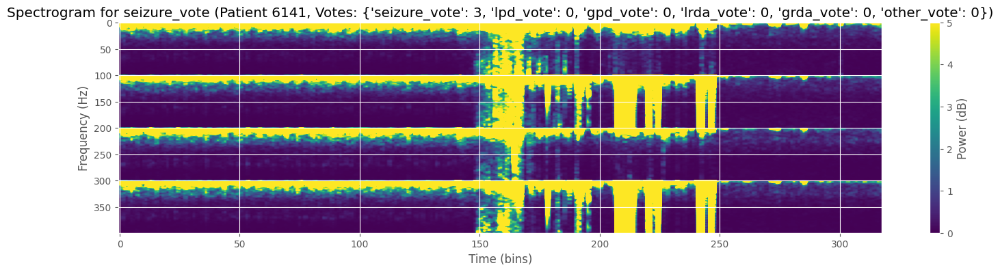

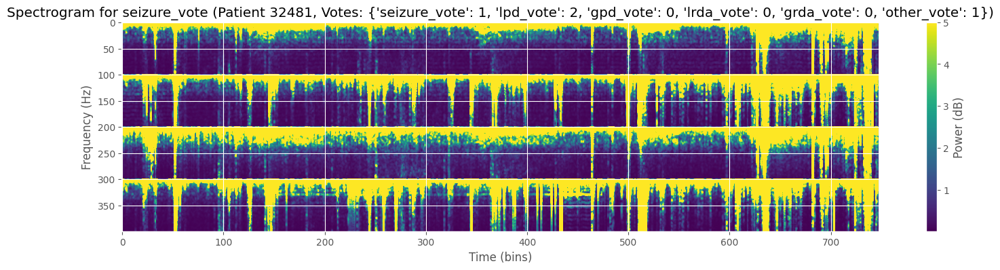

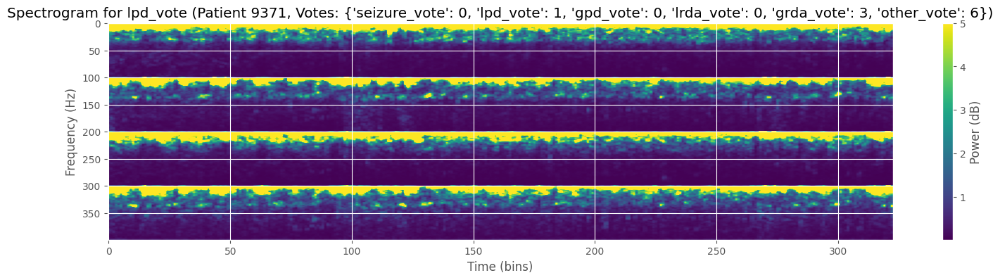

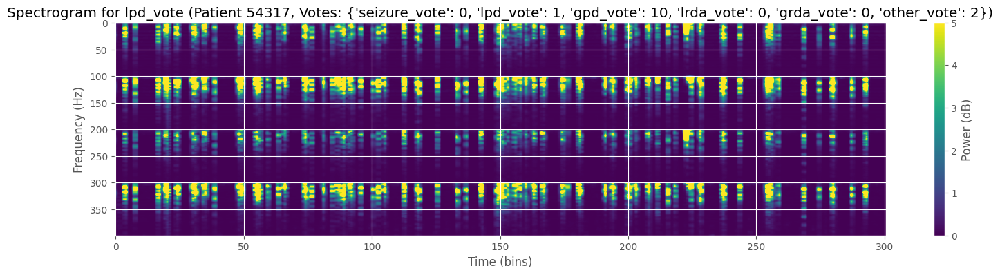

...

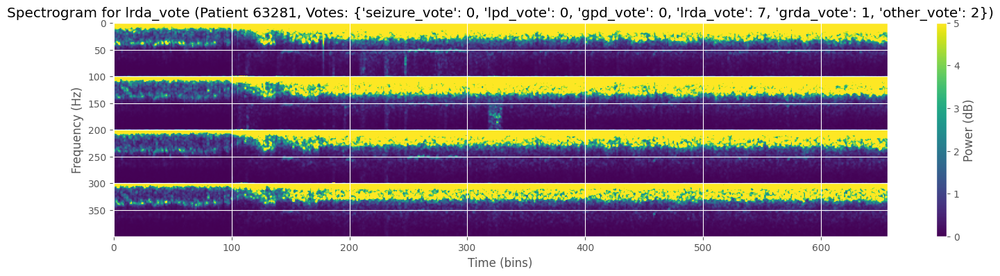

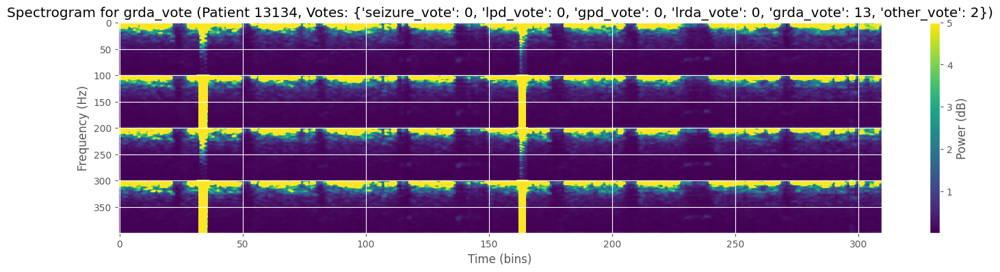

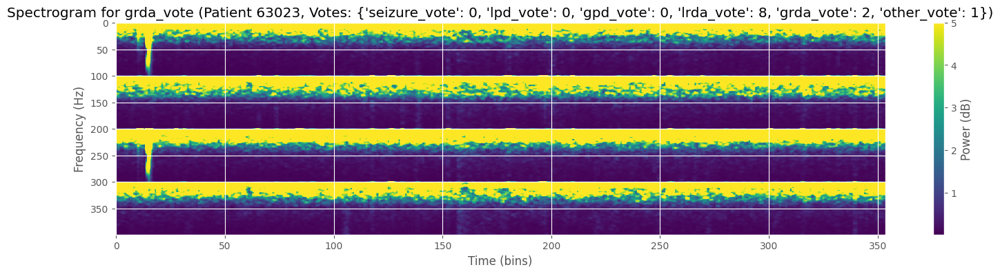

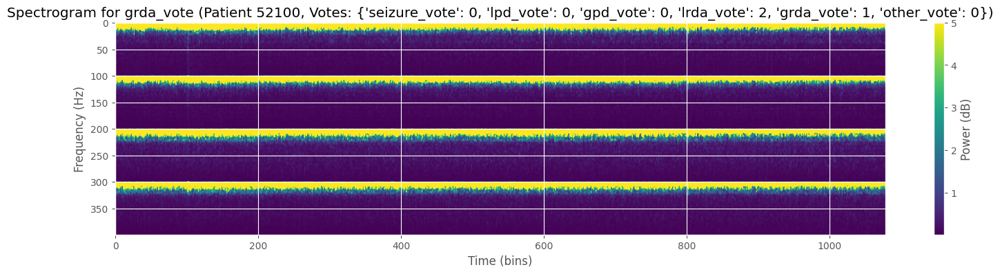

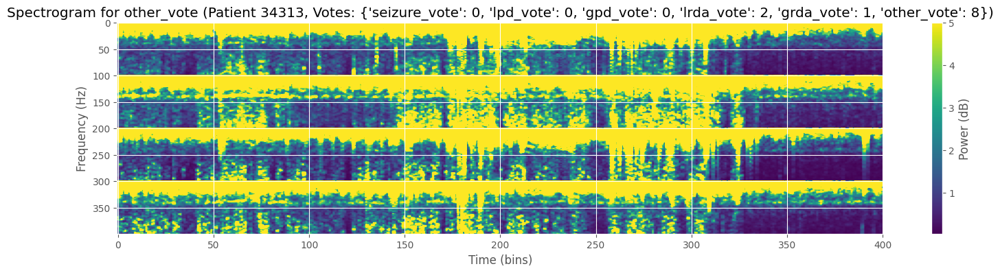

/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


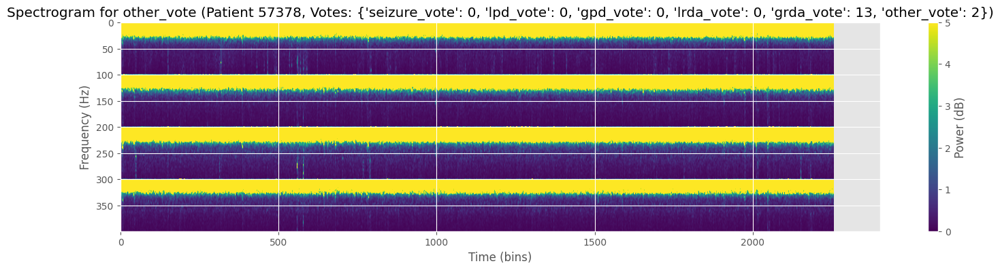

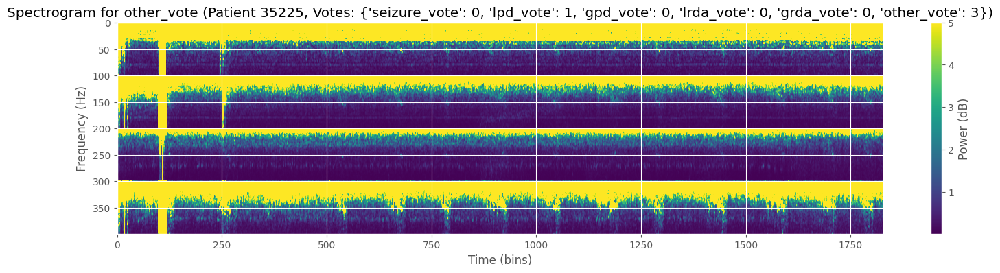

In [14]:
def plot_spectrograms_for_class(target_label, n_samples=3):
    class_samples = train_df[train_df[target_label] > 0].sample(n_samples)
    for _, row in class_samples.iterrows():
        spec = pq.read_pandas(
            f"/kaggle/input/hms-harmful-brain-activity-classification/train_spectrograms/{row.spectrogram_id}.parquet"
        ).to_pandas()
        
        plt.figure(figsize=(18, 4))
        plt.imshow(spec.iloc[:, 1:].T, aspect='auto', cmap='viridis', vmax=5)
        plt.colorbar(label='Power (dB)')
        plt.title(f"Spectrogram for {target_label} (Patient {row.patient_id}, Votes: {row[labels].to_dict()})")
        plt.xlabel("Time (bins)")
        plt.ylabel("Frequency (Hz)")
        plt.show()

for label in labels:
    plot_spectrograms_for_class(label)

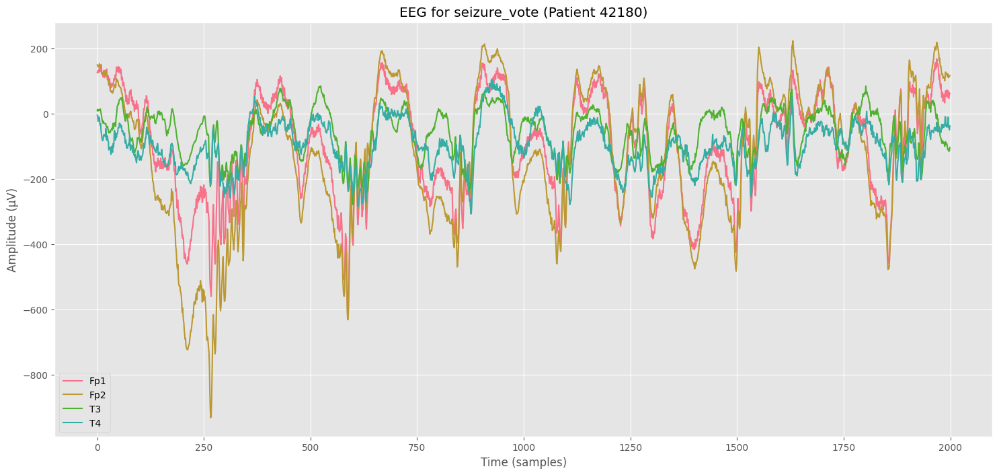

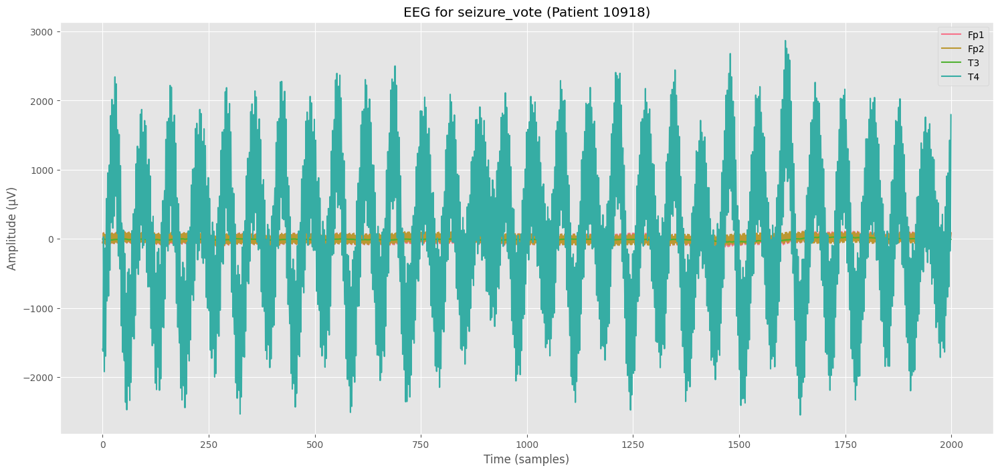

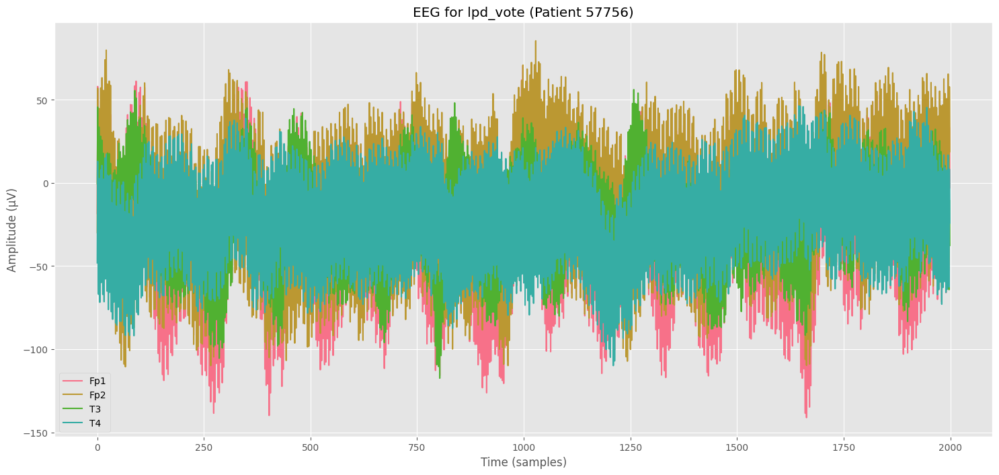

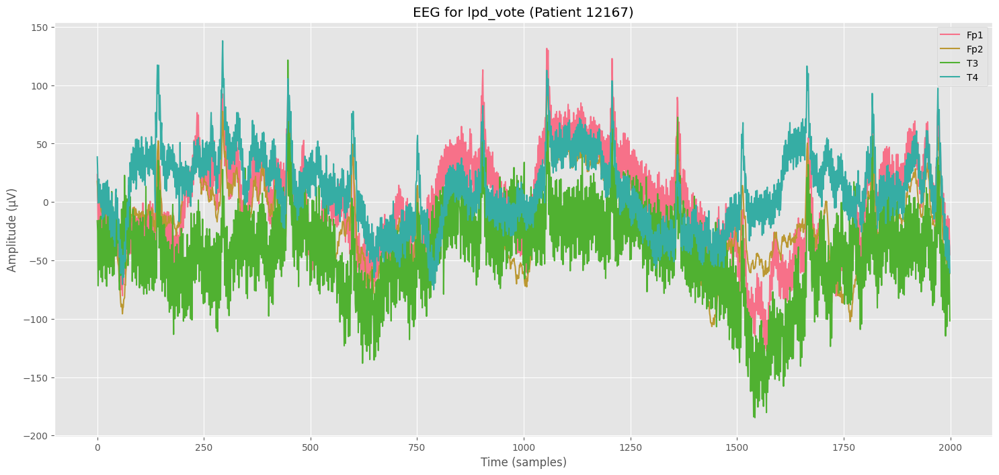

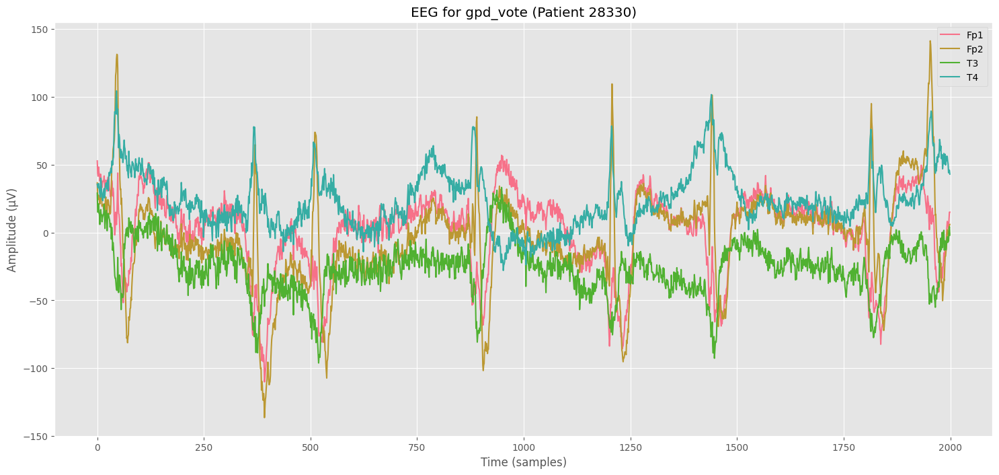

...

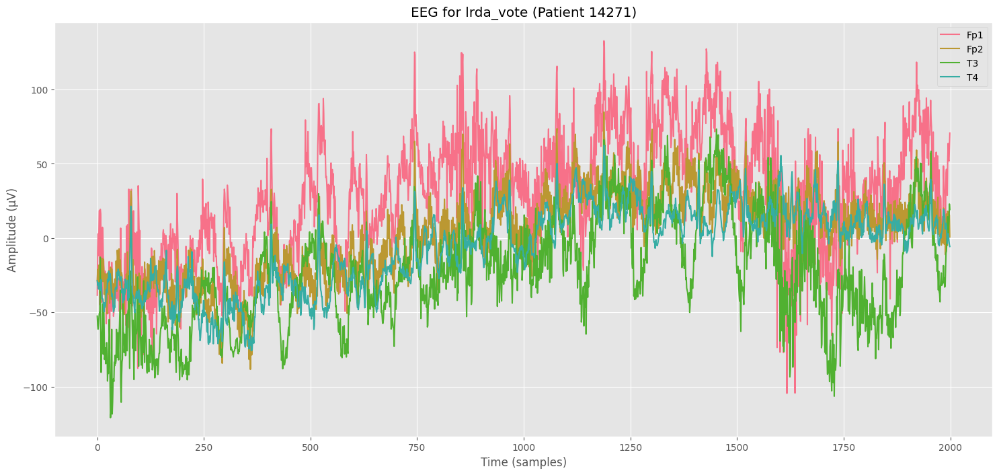

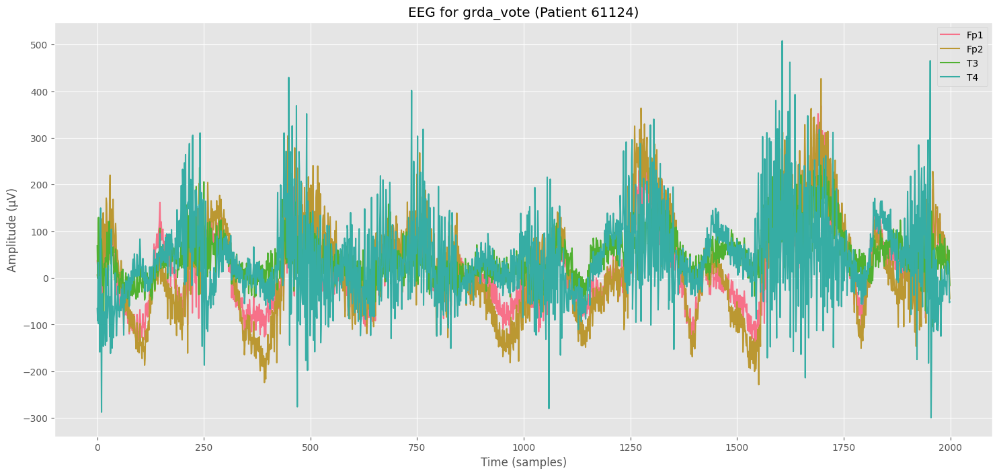

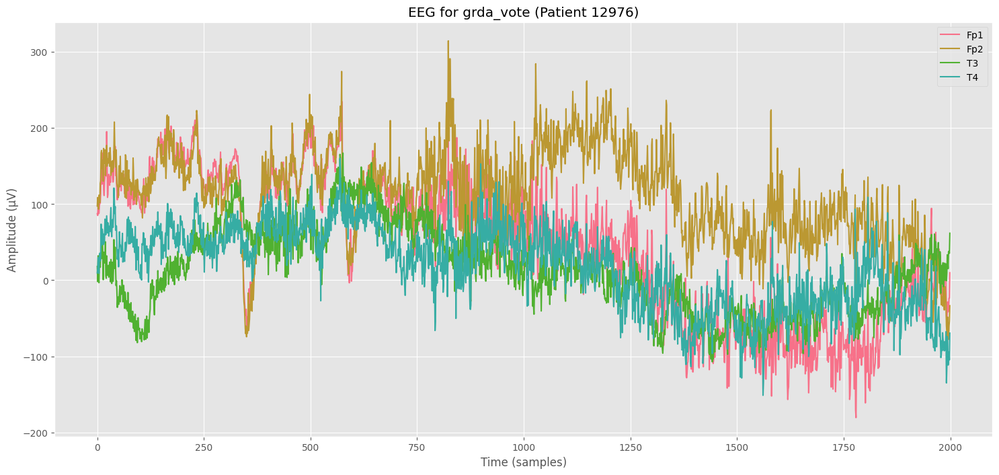

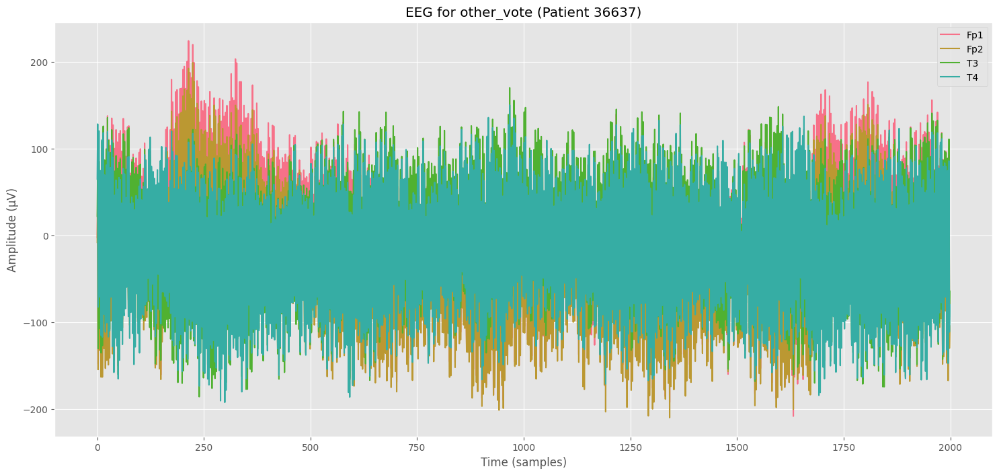

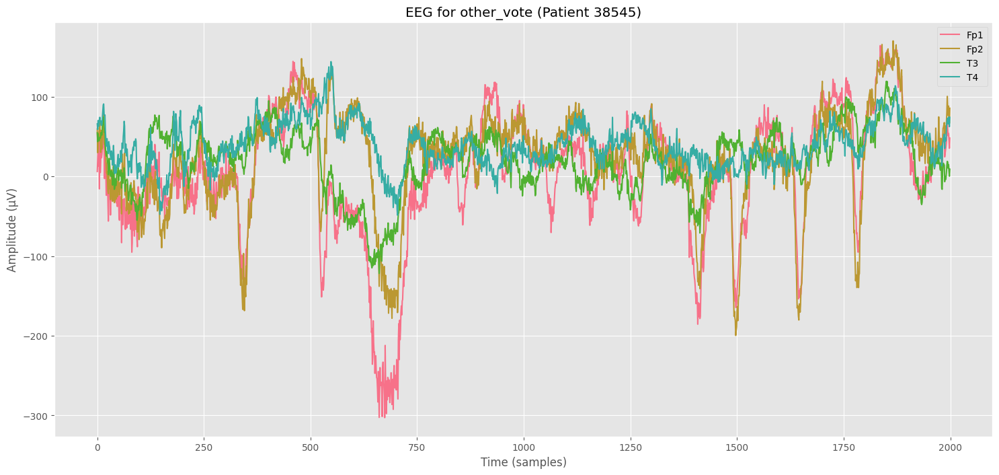

In [15]:
def plot_eegs_for_class(target_label, n_samples=2, electrodes=('Fp1', 'Fp2', 'T3', 'T4')):
    class_samples = train_df[train_df[target_label] > 0].sample(n_samples)
    for _, row in class_samples.iterrows():
        eeg = pq.read_pandas(
            f"/kaggle/input/hms-harmful-brain-activity-classification/train_eegs/{row.eeg_id}.parquet"
        ).to_pandas()
        
        plt.figure(figsize=(18, 8))
        for col in electrodes:
            plt.plot(eeg[col].values[:2000], label=col)
        plt.legend()
        plt.title(f"EEG for {target_label} (Patient {row.patient_id})")
        plt.xlabel("Time (samples)")
        plt.ylabel("Amplitude (µV)")
        plt.show()

for label in labels:
    plot_eegs_for_class(label)

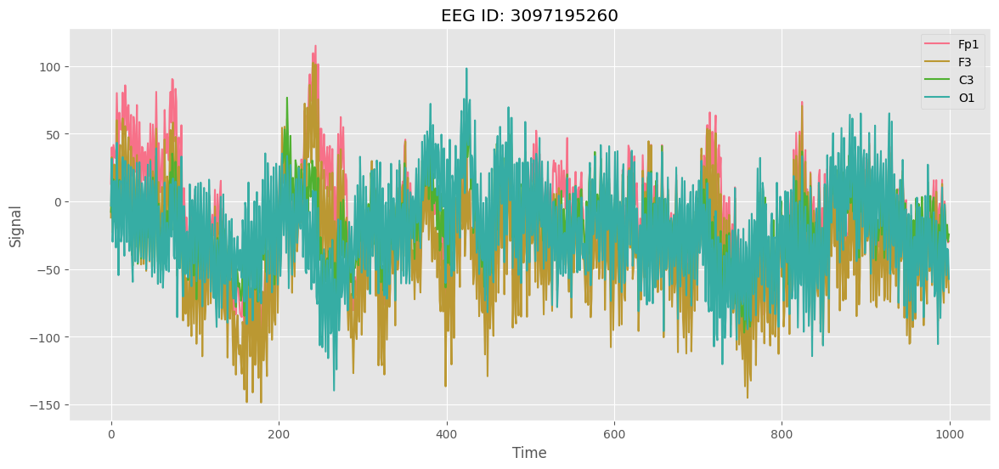

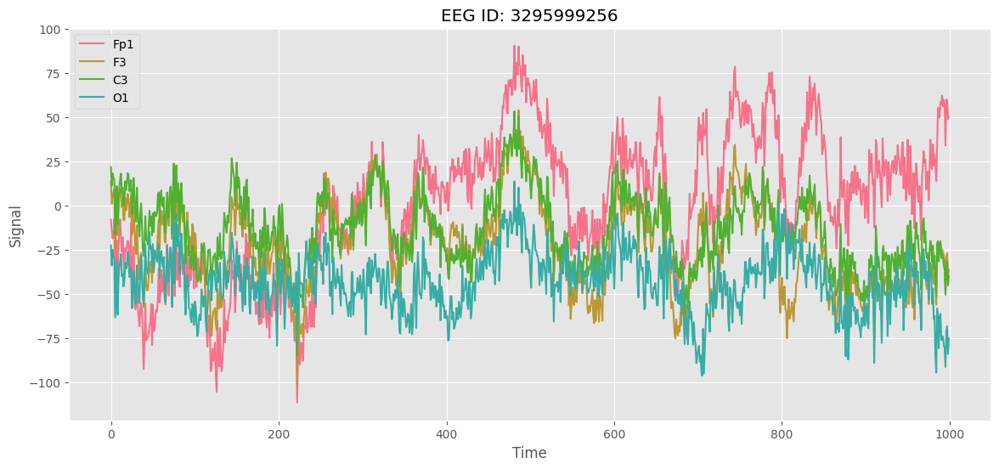

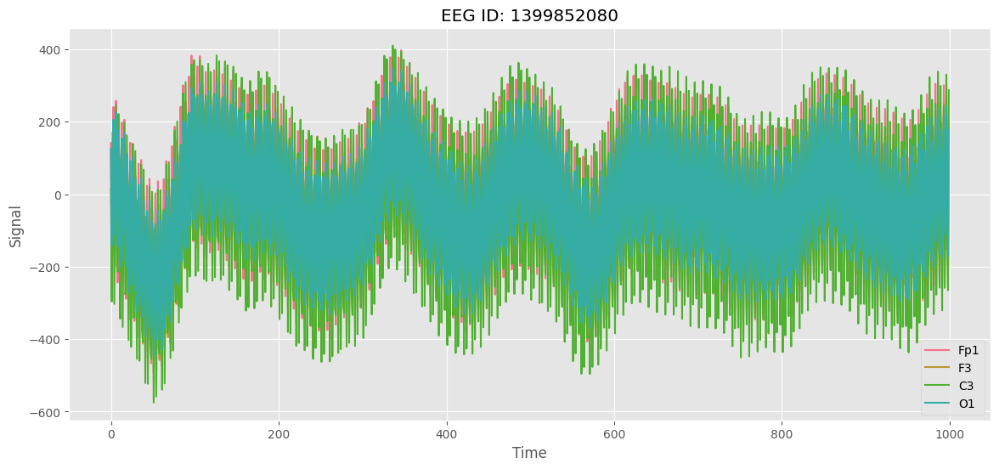

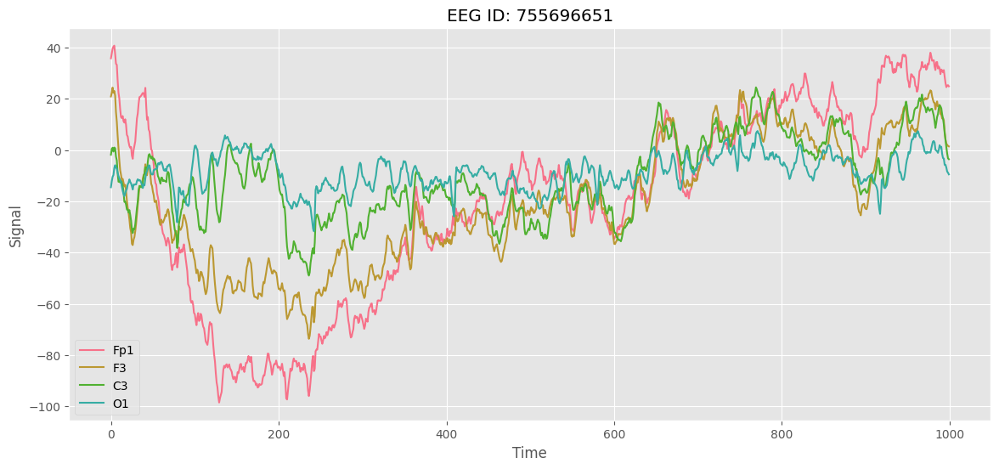

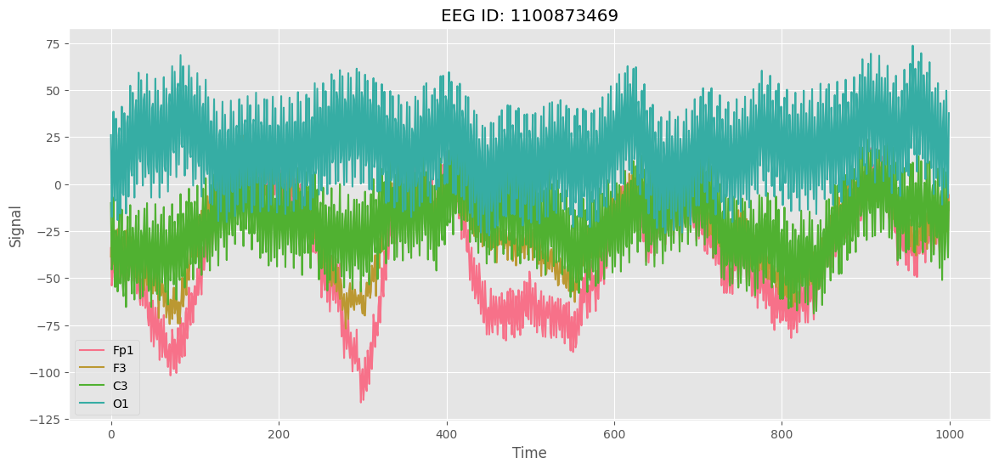

In [16]:
import os
import pandas as pd
import pyarrow.parquet as pq
import matplotlib.pyplot as plt
import random

# Directory where EEG parquet files are stored
EEG_DIR = "/kaggle/input/hms-harmful-brain-activity-classification/train_eegs"

# Get list of all available parquet files
eeg_files = [f for f in os.listdir(EEG_DIR) if f.endswith(".parquet")]

# Randomly select 5 files (or any number you prefer)
sample_files = random.sample(eeg_files, 5)

# Loop over each selected file and plot signals from specific electrodes
for file in sample_files:
    eeg_id = file.split(".")[0]
    eeg_path = os.path.join(EEG_DIR, file)

    # Load EEG data
    eeg_data = pd.read_parquet(eeg_path)

    # Electrodes to plot
    electrodes_to_plot = ['Fp1', 'F3', 'C3', 'O1']  # you can change this list

    plt.figure(figsize=(14, 6))
    for ch in electrodes_to_plot:
        if ch in eeg_data.columns:
            plt.plot(eeg_data[ch].values[:1000], label=ch)  # first 1000 samples

    plt.title(f"EEG ID: {eeg_id}")
    plt.xlabel("Time")
    plt.ylabel("Signal")
    plt.legend()
    plt.show()
